# **Imports**

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import scipy.io as sci

import torch
import torch.nn as nn
import torch.optim as optim

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'

In [5]:
# Load and preprocess images

# Samson
def load_samson(path):
    Data = {}

    # Read files
    Y_file = sci.loadmat(path + 'Y_clean.mat')
    Y_clean = Y_file['Y_clean'].astype(float)

    A_file = sci.loadmat(path + 'A_true.mat')
    A_true = A_file['A_true']

    E_file = sci.loadmat(path + 'E.mat')
    E = E_file['E']

    # Image dimensions
    nCol, nRow = 95, 95
    n, m = 96, 96
    r_channels = 3
    n_bands = 156

    # Reflexive padding
    Y = np.zeros((n, m, n_bands))
    Y[:-1, :-1] = Y_clean
    Y[-1, :], Y[:, -1] = Y[0, :], Y[:, 0]

    A_gt = np.zeros((n, m, r_channels))
    A_gt[:-1, :-1] = A_true
    A_gt[-1, :], A_gt[:, -1] = A_gt[0, :], A_gt[:, 0]

    # Return the objects in a dictionnary
    Data['r_channels'] = r_channels
    Data['n_bands'] = n_bands
    Data['image_dimensions'] = n, m
    Data['A_gt'] = torch.tensor(np.transpose(A_gt, (2,0,1)), dtype=torch.float32)
    Data['E'] = torch.tensor(E, dtype=torch.float32)
    Data['Y'] = torch.tensor(np.transpose(Y, (2,0,1)).reshape((n_bands, n*m)), dtype=torch.float32)

    # Normalize Y
    Data['Y'] = Data['Y']/Data['Y'].max()

    return Data

# Jasper
def load_jasper(path):
    Data = {}

    # Read files
    Y_file = sci.loadmat(path + 'jasperRidge2_R198.mat')
    Y = Y_file['Y'].astype(float)

    gt_file = sci.loadmat(path + 'end4.mat')
    E = gt_file['M']
    A_gt = gt_file['A']

    # Image dimensions
    r_channels = 4
    n_bands = 198
    n, m = 100, 100

    # Return the objects in a dictionnary
    Data['r_channels'] = r_channels
    Data['n_bands'] = n_bands
    Data['image_dimensions'] = n, m
    Data['A_gt'] = torch.tensor(A_gt, dtype=torch.float32).reshape([r_channels,n,m])
    Data['E'] = torch.tensor(E, dtype=torch.float32)
    Data['Y'] = torch.tensor(Y, dtype=torch.float32)

    # Normalize Y
    Data['Y'] = Data['Y']/Data['Y'].max()

    return Data

# Urban
def load_urban(path):
    Data = {}

    # Read files
    Y_file = sci.loadmat(path + 'Urban_R162.mat')
    Y = Y_file['Y'].astype(float)

    gt_file = sci.loadmat(path + 'end6_groundTruth.mat')
    E = gt_file['M']
    A_true = gt_file['A']

    # Image dimensions
    r_channels = 6
    n_bands = 162
    nCol, nRow = 307, 307
    n, m = 308, 308

    # Reflexive padding
    Y_b = np.zeros((n_bands,n,m))
    Y_b[:,:-1, :-1] = Y.reshape((n_bands,nCol,nRow))
    Y_b[:,-1, :], Y_b[:,:, -1] = Y_b[:,0,:], Y_b[:,:,0]

    A_gt = np.zeros((r_channels, n, m))
    A_gt[:,:-1, :-1] = A_true.reshape((r_channels,nCol,nRow))
    A_gt[:,-1, :], A_gt[:,:, -1] = A_gt[:,0, :], A_gt[:,:, 0]

    # Return the objects in a dictionnary
    Data['r_channels'] = r_channels
    Data['n_bands'] = n_bands
    Data['image_dimensions'] = n, m
    Data['A_gt'] = torch.tensor(A_gt, dtype=torch.float32).reshape([r_channels,n,m])
    Data['E'] = torch.tensor(E, dtype=torch.float32)
    Data['Y'] = torch.tensor(Y_b, dtype=torch.float32).reshape([n_bands,n*m])

    # Normalize Y
    Data['Y'] = Data['Y']/Data['Y'].max()

    return Data

# Plot images
def plot_image(A_gt_tensor, E_tensor, Y_tensor, r_channels, n_bands, n, m):
    # Plot abundances
    print('Abundances:')
    plt.figure(figsize=(15,10))
    for i in range(r_channels):
        ax = plt.subplot(2, 3, i+1)
        ax.imshow(A_gt_tensor[i,:,:])
    plt.tight_layout()
    plt.show()

    print('Endmembers:')
    plt.plot(E_tensor)
    plt.show()

    print('Image:')
    plt.figure(figsize=(15,10))
    for i in range(6):
        ax = plt.subplot(2, 3, i+1)
        ax.imshow((Y_tensor).reshape(n_bands,n,m)[i,:,:])
    plt.tight_layout()
    plt.show()

    print('E@A:')
    plt.figure(figsize=(15,10))
    for i in range(6):
        ax = plt.subplot(2, 3, i+1)
        ax.imshow(torch.mm(E_tensor,
                           A_gt_tensor.view(r_channels, n*m)).reshape(n_bands,n,m)[i,:,:])
    plt.tight_layout()
    plt.show()

# **Importing data**

In [6]:
path = "./"

#Data = load_samson(path)
#Data = load_jasper(path)
Data = load_urban(path)

r_channels = Data['r_channels']
n_bands = Data['n_bands']
n, m = Data['image_dimensions']
A_gt_tensor = Data['A_gt']
E_tensor = Data['E']
Y_tensor = Data['Y']

# Groud truth loss
nn.MSELoss()(torch.mm(E_tensor, A_gt_tensor.view(r_channels, n*m)), Y_tensor)

tensor(0.0054)

# **Plot data**

Abundances:


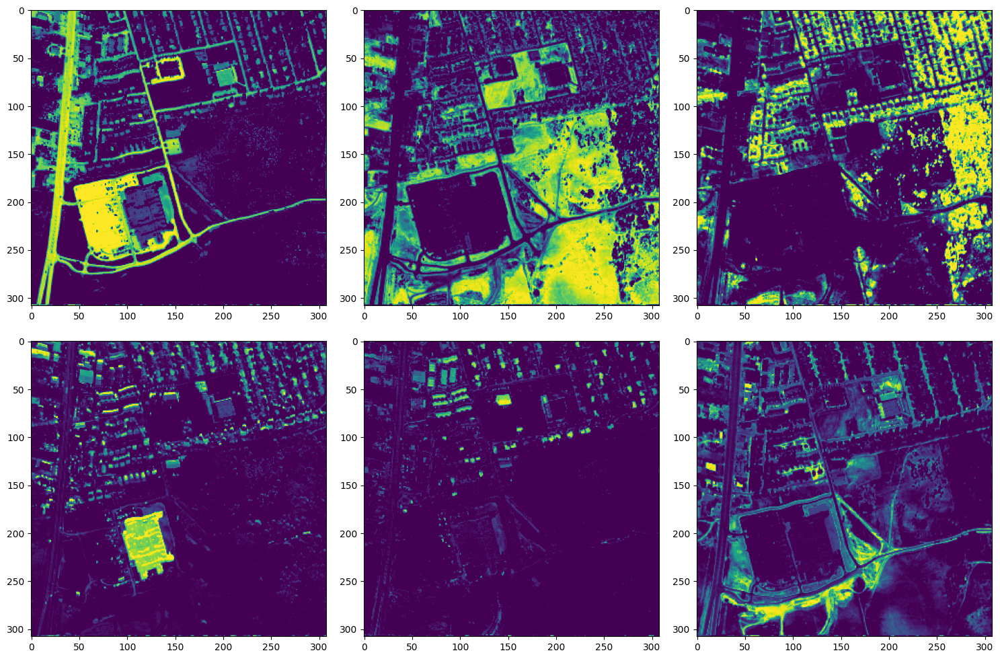

Endmembers:


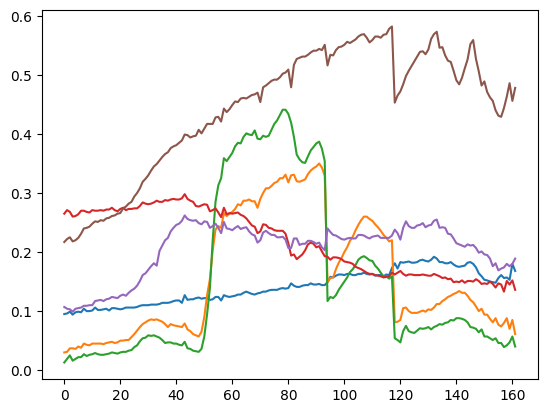

Image:


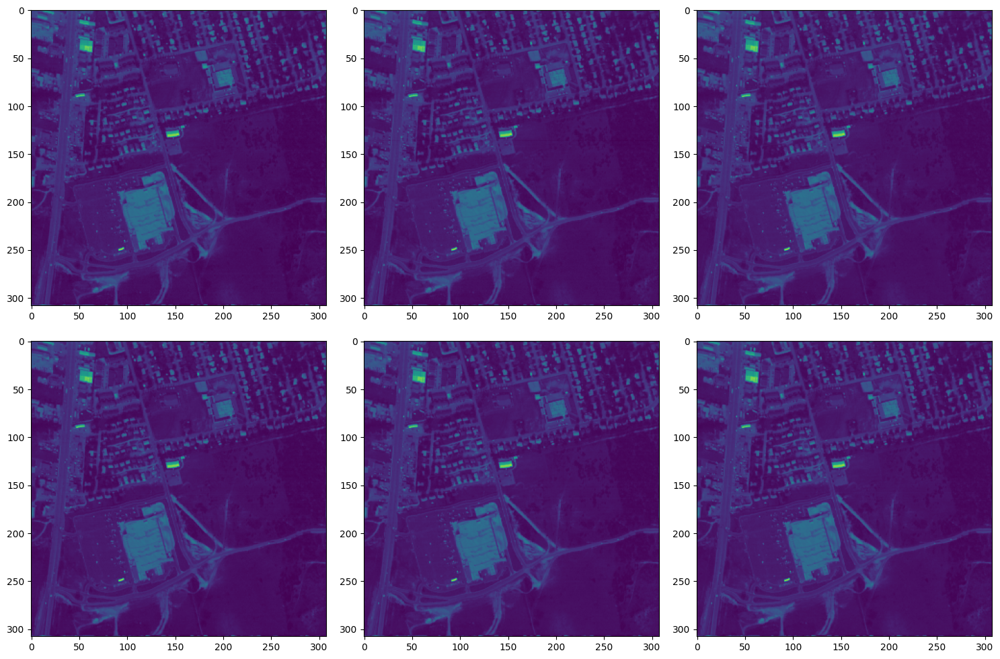

E@A:


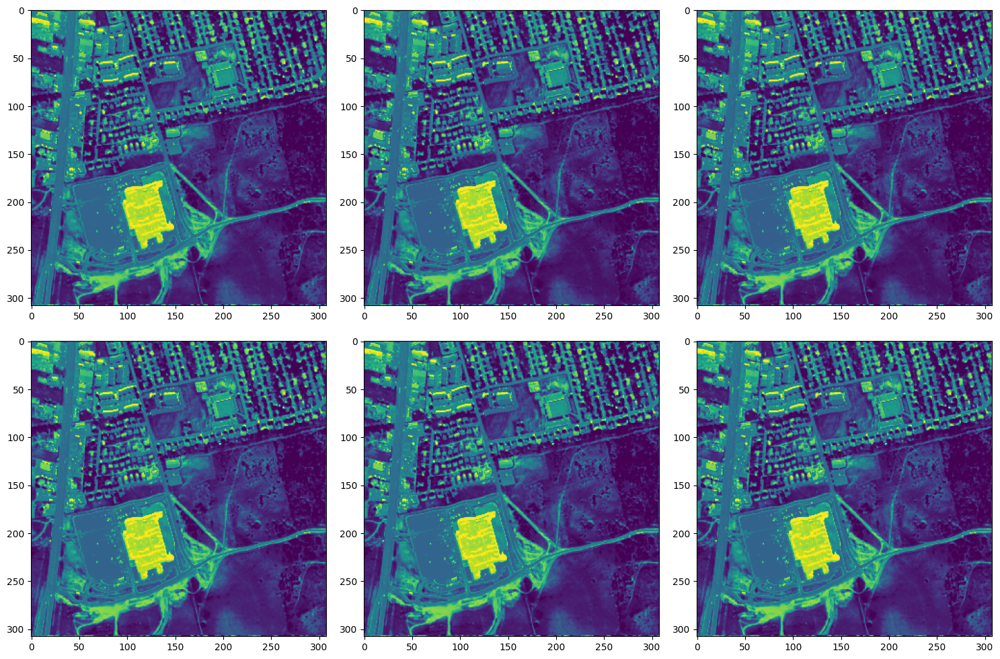

In [7]:
plot_image(A_gt_tensor, E_tensor, Y_tensor, r_channels, n_bands, n, m)

# **Initialisations**

### **Random initialisation**

In [8]:
A = torch.normal(0,1,size=(1,r_channels,n,m), dtype=torch.float32)

Abundances:


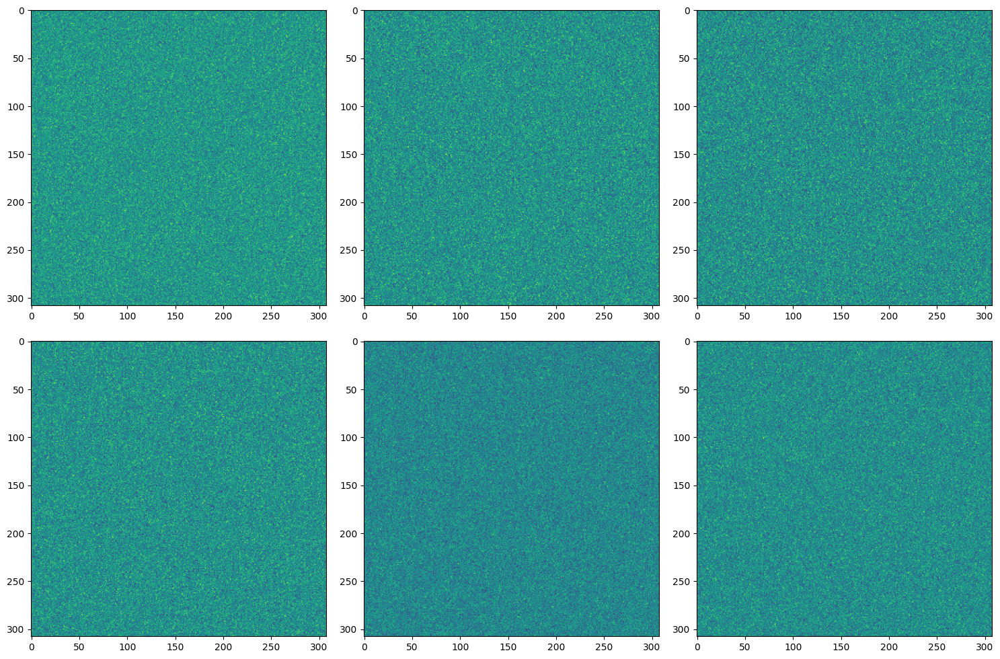

In [9]:
print('Abundances:')
plt.figure(figsize=(15,10))
for i in range(r_channels):
    ax = plt.subplot(2, 3, i+1)
    ax.imshow(A[0,i,:,:])
plt.tight_layout()
plt.show()

## **SPA initialisation**

In [10]:
def simpleSPA(Xin,r,optDisp=False): # TO DO.

    R = Xin.copy()

    K = np.zeros(r)

    for ii in range(r):

        if optDisp  :
            fig = plt.figure()
            ax = fig.add_subplot(111,projection='3d')
            ax.scatter(R[0,:],R[1,:],R[2,:])
            ax.set_title("Scatter plot of the residual for r = "+str(ii))
            plt.show()

        print('Max residual %s'%np.max(R))

        p = np.argmax(np.linalg.norm(R,axis=0))

        K[ii] = p

        r_p = R[:,p].reshape(-1,1)

        R = (np.identity(R.shape[0]) - r_p@r_p.T / np.linalg.norm(r_p)**2) @ R


    if optDisp  :
        fig = plt.figure()
        ax = fig.add_subplot(111,projection='3d')
        ax.scatter(R[0,:],R[1,:],R[2,:])
        ax.set_title("Scatter plot of the residual for r = "+str(r))
        plt.show()

    return K.astype(int)

In [11]:
K_spa = simpleSPA(Y_tensor.detach().cpu().numpy(), 6, optDisp = False)
A_star = Y_tensor.detach().cpu().numpy()[:, K_spa]

Max residual 1.0
Max residual 0.6034173614786836
Max residual 0.5036204269041741
Max residual 0.20262883702776546
Max residual 0.18078414315262445
Max residual 0.16099373137845074


In [12]:
A_star.shape

(162, 6)

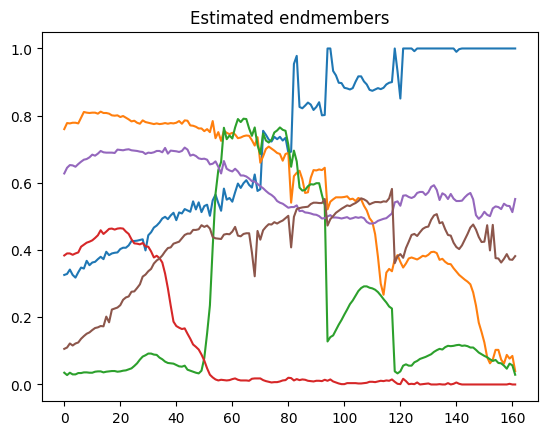

In [13]:
plt.plot(A_star)
plt.title("Estimated endmembers")
plt.show()

In [14]:
def prox_l1(S_est, thrd):
  S_est = np.sign(S_est) * np.maximum(np.abs(S_est) - thrd, 0.)
  return S_est

In [15]:
def ISTA(X,A = np.eye(2),n=2,lamb=0,nbIt = 100):
    k=0
    S_est = np.random.rand(n, X.shape[1])
    gamma = 0.9 / np.linalg.norm(A.T @ A)
    while (k<nbIt):
      S_est = prox_l1(S_est + gamma*A.T@(X-A@S_est), lamb*gamma)
      k+=1
    return S_est

In [16]:
S_estf = ISTA(Y_tensor.detach().cpu().numpy(), A_star, n=6, lamb=1000, nbIt=1000)

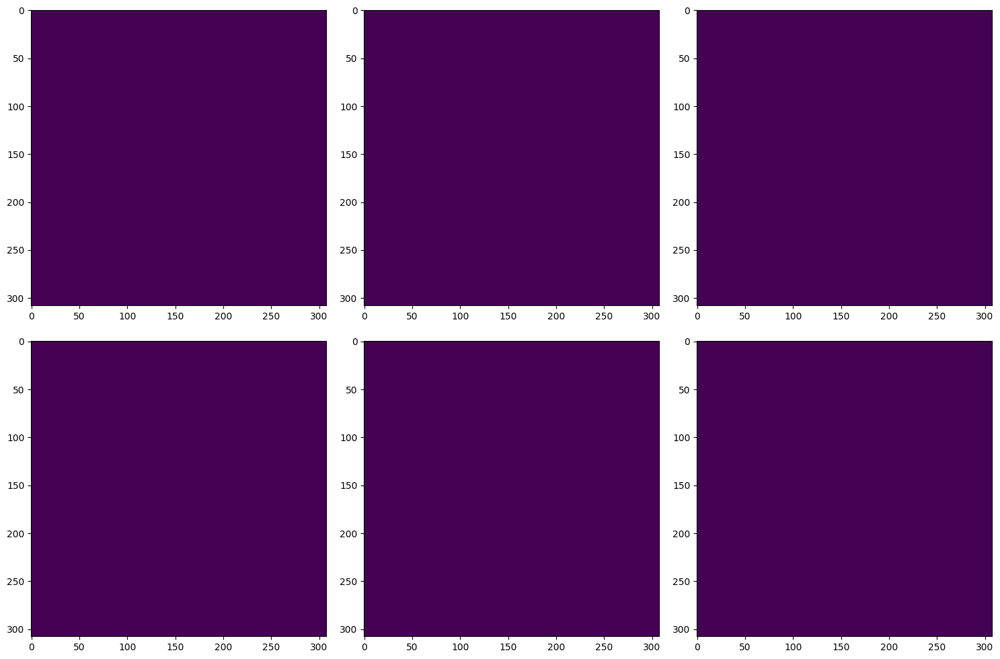

In [17]:
plt.figure(figsize=(15,10))
for i in range(r_channels):
    ax = plt.subplot(2, 3, i+1)
    ax.imshow(S_estf[i,:].reshape(n,m))
plt.tight_layout()
plt.show()

## **PALM intialisation**

In [18]:
def prox_positive(S): # TO DO
    S = np.maximum(0,S)
    return S

In [19]:
def PALM(X, n=2, nbIt = 100, Ainit=None, Sinit=None): # TO DO : reutiliser le PALM du TP precedent et l'adapter

    if Ainit is None :
        A_est = np.random.rand(X.shape[0], n)
    else :
        A_est = Ainit
    if Sinit is None :
        S_est = np.random.rand(n, X.shape[1])
    else:
        S_est = Sinit

    k=0

    while k < nbIt:

        gamma = 0.9/np.linalg.norm(A_est@(A_est.T))
        eta = 0.9/np.linalg.norm(S_est@(S_est.T))

        S_est = prox_positive(S_est + gamma * A_est.T @ (X-A_est@S_est))
        A_est = prox_positive( A_est + eta * (X-A_est@S_est)@S_est.T)

        k+=1

    return A_est, S_est

In [20]:
A_est, S_est = PALM(Y_tensor.detach().cpu().numpy(), n=6, nbIt = 1000)

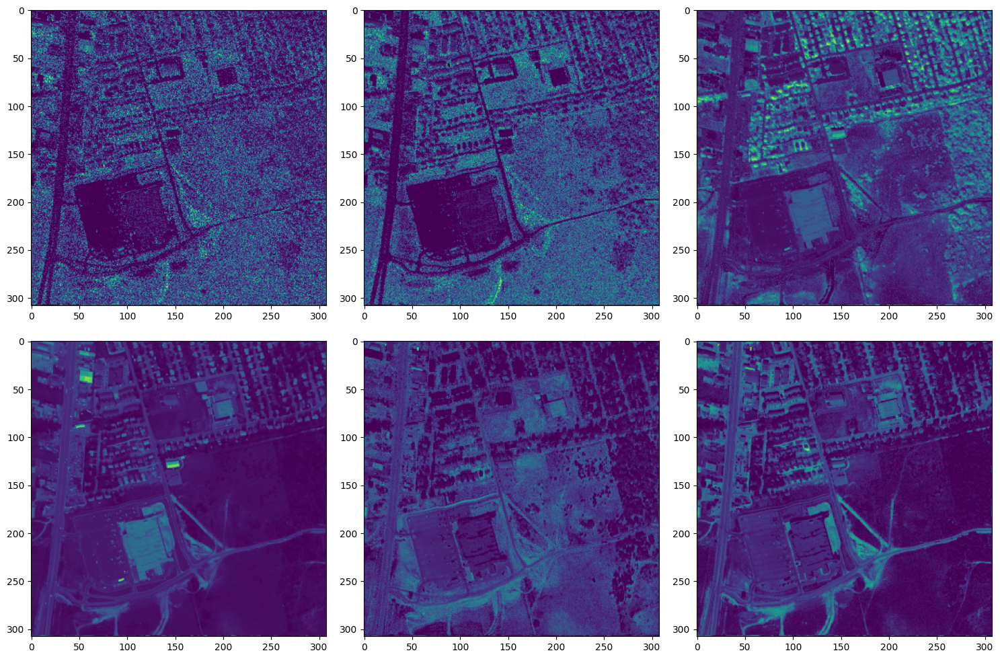

In [21]:
plt.figure(figsize=(15,10))
for i in range(r_channels):
    ax = plt.subplot(2, 3, i+1)
    ax.imshow(S_est[i,:].reshape(n,m))
plt.tight_layout()
plt.show()

In [22]:
palm_init = np.zeros((6, 308, 308))

for i in range(6):
  palm_init[i,:,:] = S_est[i,:].reshape(n,m)

# Convert the reshaped array to a PyTorch tensor
palm_tensor = torch.from_numpy(palm_init).unsqueeze(0)

## **Model**

In [23]:
# Models
encoder_channels = [256,256]
decoder_channels = [256,256,r_channels]
skip_channels = 4

# Define the network architecture
class Undip_net_paper(nn.Module):
  def __init__(self):
    super(Undip_net_paper, self).__init__()

    self.encoder1 = nn.Sequential(nn.Conv2d(r_channels, encoder_channels[0], (3, 3),
                                            stride=(2, 2), padding_mode='reflect', padding=1, dilation=1), # (308,308) to (154,154)
                                  nn.BatchNorm2d(encoder_channels[0]),
                                  nn.LeakyReLU(inplace=True, negative_slope=0.1),
    )

    self.encoder2 = nn.Sequential(nn.Conv2d(encoder_channels[0], encoder_channels[1], (3, 3),
                                            stride=(1, 1), padding_mode='reflect', padding=1, dilation=1),
                                  nn.BatchNorm2d(encoder_channels[1]),
                                  nn.LeakyReLU(inplace=True, negative_slope=0.1), # (154,154)
    )

    self.upsample = nn.Upsample(scale_factor=2, mode='bilinear')


    self.skip = nn.Sequential(nn.Conv2d(r_channels, skip_channels, (1, 1), stride=(1, 1),
                                        padding=0, dilation=1),
                              nn.BatchNorm2d(skip_channels),
                              nn.LeakyReLU(inplace=True, negative_slope=0.1),
    )



    self.decoder1 = nn.Sequential(nn.BatchNorm2d(encoder_channels[1]+skip_channels),
                                  nn.Conv2d(encoder_channels[1]+skip_channels, decoder_channels[0],
                                            (3, 3), stride=(1, 1), padding_mode='reflect', padding=1, dilation=1),
                                  nn.BatchNorm2d(decoder_channels[0]),
                                  nn.LeakyReLU(inplace=True, negative_slope=0.1)
    )



    self.decoder2 = nn.Sequential(nn.Conv2d(decoder_channels[0], decoder_channels[1], (3, 3),
                                            stride=(1, 1), padding_mode='reflect', padding=1, dilation=1),
                                  nn.BatchNorm2d(decoder_channels[1]),
                                  nn.LeakyReLU(inplace=True, negative_slope=0.1), # (77,77)
    )

    self.decoder3 = nn.Sequential(nn.Conv2d(decoder_channels[1], decoder_channels[2], (3, 3),
                                            stride=(1, 1), padding_mode='reflect', padding=1, dilation=1),
                                  nn.Softmax(dim=1)
    )


  def forward(self, input):


    current_feature = self.encoder1(input)
    current_feature = self.encoder2(current_feature)
    current_feature = self.upsample(current_feature)

    current_skip_output = self.skip(input)

    current_feature = torch.cat((current_feature,current_skip_output), dim=1)


    current_feature = self.decoder1(current_feature)
    current_feature = self.decoder2(current_feature)
    output = self.decoder3(current_feature)


    return output

In [24]:
# Training algorithm
def train(model, input, E_tensor, Y_tensor, epochs=3000, lr=0.001):

    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    model = model.to(device)
    input = input.to(device)
    criterion = criterion.to(device)
    E_tensor = E_tensor.to(device)
    Y_tensor = Y_tensor.to(device)

    history = {'losses': [],
               'RMSE': [],
               'outputs': torch.zeros([epochs, 1, r_channels, n, m])}

    model.eval() if optimizer is None else model.train()
    for epoch in range(1, epochs + 1):

        model.train()
        train_loss = 0.0

        optimizer.zero_grad()

        output = model(input)

        loss = criterion(torch.mm(E_tensor, output.view(r_channels, n*m)), Y_tensor)

        print('Epoch {}: '.format(epoch), loss.item())
        history['losses'].append(loss.item())
        history['RMSE'].append(nn.MSELoss()(torch.mm(E_tensor, output.view(r_channels, n*m)),
                                            Y_tensor).item())
        history['outputs'][epoch-1] = output.detach()

        loss.backward()
        optimizer.step()

    return output, history

In [25]:
Undip_model = Undip_net_paper()
lr = 0.001
epochs = 1000

In [26]:
output, history = train(Undip_model, palm_tensor, E_tensor, Y_tensor, lr=lr, epochs=epochs)

Epoch 1:  0.011695068329572678
Epoch 2:  0.008959540165960789
Epoch 3:  0.008542343974113464
Epoch 4:  0.008628820069134235
Epoch 5:  0.008451090194284916
Epoch 6:  0.00831303559243679
Epoch 7:  0.007949190214276314
Epoch 8:  0.007609732449054718
Epoch 9:  0.00727566285058856
Epoch 10:  0.007016965188086033
Epoch 11:  0.0068402537144720554
Epoch 12:  0.006659260950982571
Epoch 13:  0.006528302561491728
Epoch 14:  0.006345097906887531
Epoch 15:  0.006227601785212755
Epoch 16:  0.00609271414577961
Epoch 17:  0.006019435822963715
Epoch 18:  0.005901609547436237
Epoch 19:  0.005844205152243376
Epoch 20:  0.005781302694231272
Epoch 21:  0.005723407492041588
Epoch 22:  0.005663400981575251
Epoch 23:  0.005611519794911146
Epoch 24:  0.005570128094404936
Epoch 25:  0.005521956831216812
Epoch 26:  0.005477800965309143
Epoch 27:  0.005447277799248695
Epoch 28:  0.005402417853474617
Epoch 29:  0.0053634983487427235
Epoch 30:  0.005332044325768948
Epoch 31:  0.005295841488987207
Epoch 32:  0.00526

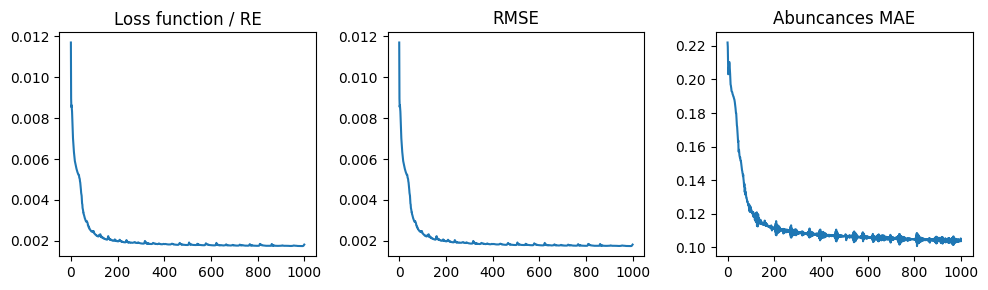

In [27]:
def plot_history(history, A_gt_tensor):
    plt.figure(figsize=(10,3))
    plt.subplot(1,3,1)
    plt.title('Loss function / RE')
    plt.plot(history['losses'])
    plt.subplot(1,3,2)
    plt.title('RMSE')
    plt.plot(history['RMSE'])
    plt.subplot(1,3,3)
    plt.title('Abuncances MAE')
    plt.plot([nn.L1Loss()(o, A_gt_tensor.view([1,r_channels,n,m])) for o in history['outputs']])
    plt.tight_layout()
    plt.show()

plot_history(history, A_gt_tensor)

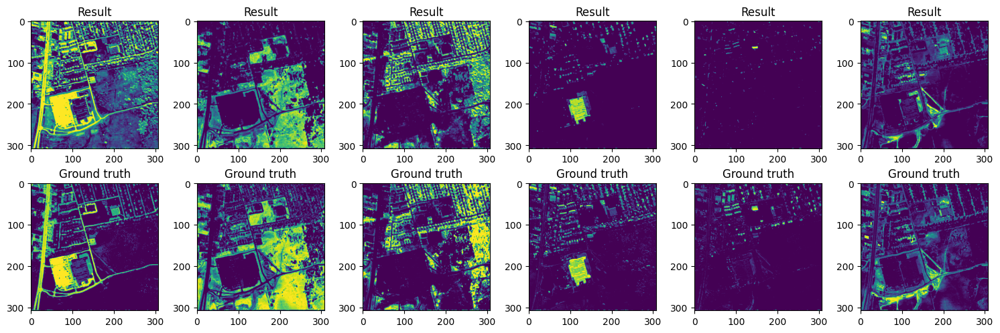

In [28]:
# View results
def view_results(r_channels, A, A_gt_tensor):
    plt.figure(figsize=(15,5))
    for i in range(r_channels):
        ax = plt.subplot(2, r_channels, i+1)
        im = A.cpu().detach()[0, i,:,:]
        ax.imshow(im)
        plt.title('Result')

    for i in range(r_channels):
        ax = plt.subplot(2, r_channels, i+1+r_channels)
        im = A_gt_tensor.view([1,r_channels,n,m])[0,i,:,:]
        ax.imshow(im)
        plt.title('Ground truth')

    plt.tight_layout()
    plt.show()

view_results(r_channels, output, A_gt_tensor)